In [199]:
import os
import numpy as np
import pandas as pd
import cv2 as cv
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
from PIL import Image

In [200]:
def fix_layout(width:int=95):
    from IPython.core.display import display, HTML
    display(HTML('<style>.container { width:' + str(width) + '% !important; }</style>'))

fix_layout()

In [201]:
# reminder: image is downscaled by 3, we need to downscale the label coordinates as well
scale = 3

In [365]:
# location of silicon wafer 1 data
dir_silicon_wafer_1 = "../dataset/section-segmentation-dataset/silicon_wafer_1"
dir_silicon_wafer_2 = "../dataset/section-segmentation-dataset/silicon_wafer_2"
dir_silicon_wafer_3 = "../dataset/section-segmentation-dataset/silicon_wafer_3"

In [203]:
index = pd.MultiIndex.from_tuples([('point_1', 'x'), ('point_1', 'y'), ('point_2', 'x'), ('point_2', 'y'),
                                   ('point_3', 'x'), ('point_3', 'y'), ('point_4', 'x'), ('point_4', 'y')])

### Drawing

In [363]:
def rgb(hex_color):
    return tuple(int(hex_color.lstrip('#')[i:i+2], 16) for i in (0, 2 ,4))

In [364]:
def draw_labels(image, labels_df, thickness, color, fill_poly):
    for row in range(labels_df.shape[0]):
        pts = np.array(labels_df.loc[row]).reshape((-1,1,2))
        if fill_poly:
            image = cv.fillPoly(image, np.int32([pts]), color=rgb(color))
        else:
            image = cv.polylines(image, np.int32([pts]), True, color=rgb(color), thickness=thickness)
    
    return image

In [449]:
wafer_tissue_lbl = pd.read_csv(f"{dir_silicon_wafer_1}/source_sections_tissue.txt", sep="\t|,", header=None, names=index, engine='python')//3

In [450]:
wafer_mag_lbl = pd.read_csv(f"{dir_silicon_wafer_1}/source_sections_mag.txt", sep="\t|,", header=None, names=index, engine='python')//3

In [451]:
path_img= f"{dir_silicon_wafer_1}/wafer_1_downsized_3.tif"
if os.path.isfile(path_img):
    wafer_1 = cv.imread(path_img)
else:
    print ("The file " + path_img + " does not exist.")

In [438]:
f_seg_tissues= open("boxes_tissues_3.txt","w+")
f_seg_mag= open("boxes_mag_3.txt","w+")
f_boxes= open("new_boxes_3.txt","w+")
for i in range(wafer_mag_lbl.shape[0]):
    
    margin = 50
    
    temp_mag = wafer_mag_lbl.iloc[i]
    max_x_mag = max(temp_mag['point_1']['x'], temp_mag['point_2']['x'], temp_mag['point_3']['x'], temp_mag['point_4']['x'])
    min_x_mag = min(temp_mag['point_1']['x'], temp_mag['point_2']['x'], temp_mag['point_3']['x'], temp_mag['point_4']['x'])
    max_y_mag = max(temp_mag['point_1']['y'], temp_mag['point_2']['y'], temp_mag['point_3']['y'], temp_mag['point_4']['y'])
    min_y_mag = min(temp_mag['point_1']['y'], temp_mag['point_2']['y'], temp_mag['point_3']['y'], temp_mag['point_4']['y'])
    
    temp_tissue = wafer_tissue_lbl.iloc[i]

    max_x = max(max_x_mag,temp_tissue['point_1']['x'], temp_tissue['point_2']['x'], temp_tissue['point_3']['x'], temp_tissue['point_4']['x']) + margin//3 
    min_x = min(min_x_mag,temp_tissue['point_1']['x'], temp_tissue['point_2']['x'], temp_tissue['point_3']['x'], temp_tissue['point_4']['x']) - margin//3 
    max_y = max(max_y_mag,temp_tissue['point_1']['y'], temp_tissue['point_2']['y'], temp_tissue['point_3']['y'], temp_tissue['point_4']['y']) + margin//3 
    min_y = min(min_y_mag,temp_tissue['point_1']['y'], temp_tissue['point_2']['y'], temp_tissue['point_3']['y'], temp_tissue['point_4']['y']) - margin//3
    
    crop_tissues_p1_x = temp_tissue['point_1']['x'] - min_x  
    crop_tissues_p1_y = temp_tissue['point_1']['y'] - min_y  
    
    crop_tissues_p2_x = temp_tissue['point_2']['x'] - min_x  
    crop_tissues_p2_y = temp_tissue['point_2']['y'] - min_y  
    
    crop_tissues_p3_x = temp_tissue['point_3']['x'] - min_x  
    crop_tissues_p3_y = temp_tissue['point_3']['y'] - min_y 
    
    crop_tissues_p4_x = temp_tissue['point_4']['x'] - min_x 
    crop_tissues_p4_y = temp_tissue['point_4']['y'] - min_y 
    
    crop_mag_p1_x = temp_mag['point_1']['x'] - min_x  
    crop_mag_p1_y = temp_mag['point_1']['y'] - min_y  
    
    crop_mag_p2_x = temp_mag['point_2']['x'] - min_x  
    crop_mag_p2_y = temp_mag['point_2']['y'] - min_y  
    
    crop_mag_p3_x = temp_mag['point_3']['x'] - min_x  
    crop_mag_p3_y = temp_mag['point_3']['y'] - min_y 
    
    crop_mag_p4_x = temp_mag['point_4']['x'] - min_x 
    crop_mag_p4_y = temp_mag['point_4']['y'] - min_y 
    
    f_seg_tissues.write("%d,%d\t%d,%d\t%d,%d\t%d,%d\r\n" % (crop_tissues_p1_x,crop_tissues_p1_y,  crop_tissues_p2_x,crop_tissues_p2_y,  crop_tissues_p3_x,crop_tissues_p3_y,  crop_tissues_p4_x,crop_tissues_p4_y))
    f_seg_mag.write("%d,%d\t%d,%d\t%d,%d\t%d,%d\r\n" % (crop_mag_p1_x,crop_mag_p1_y,  crop_mag_p2_x,crop_mag_p2_y,  crop_mag_p3_x,crop_mag_p3_y,  crop_mag_p4_x,crop_mag_p4_y))
    f_boxes.write("%d,%d\t%d,%d\t%d,%d\t%d,%d\r\n" % (min_x, min_y,  max_x,min_y,  max_x,max_y,  min_x,max_y))
    
    crop_img = wafer_1[min_y:max_y, min_x:max_x]
    cv.imwrite("data3_cropped/"+str(i)+".tiff", crop_img)
f_seg_tissues.close()
f_seg_mag.close()
f_boxes.close()

In [452]:
box_ = pd.read_csv(f"new_boxes_1.txt", sep="\t|,", header=None, names=index, engine='python')
#Without scale
box_.head()

point_1       point_2       point_3       point_4      
        x     y       x     y       x     y       x     y
0    2225   921    2397   921    2397  1093    2225  1093
1    2075   958    2251   958    2251  1134    2075  1134
2    1974  1088    2148  1088    2148  1260    1974  1260
3    2117  1075    2296  1075    2296  1262    2117  1262
4    2242  1046    2420  1046    2420  1228    2242  1228

In [453]:
path_img= f"{dir_silicon_wafer_1}/wafer_1_downsized_3.tif"
if os.path.isfile(path_img):
    wafer_1 = cv.imread(path_img)
else:
    print ("The file " + path_img + " does not exist.")

In [441]:
thickness = 5
magnet_color = "#00cccc"
tissue_color = "#ff6666"

fill_poly = False

In [455]:
wafer_1 = draw_labels(wafer_1, box_, thickness, magnet_color, fill_poly)

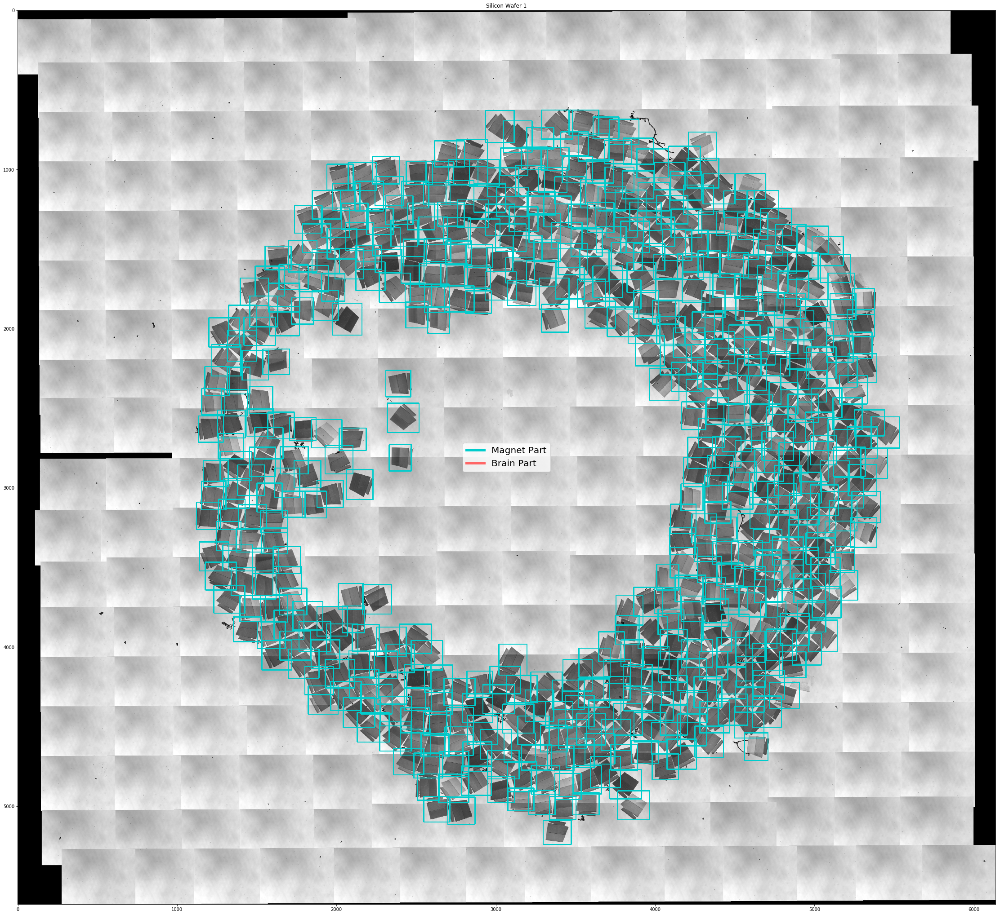

In [456]:
plt.figure(figsize=(40, 36.61))
plt.imshow(wafer_1)

plt.title('Silicon Wafer 1')

plt.legend(handles=legend_elements, loc='center', fontsize=20)

plt.show()

In [458]:
boxes_tissues = pd.read_csv(f"boxes_tissues_1.txt", sep="\t|,", header=None, names=index, engine='python')
#Without scale
boxes_tissues.head()

point_1      point_2     point_3     point_4    
        x    y       x   y       x   y       x   y
0      36  110      16  58     142  16     148  67
1      40  114      16  64     141  16     150  65
2      38  110      16  59     143  16     149  66
3      45  126      16  78     132  16     147  66
4      44  123      16  75     136  16     148  65

In [459]:
boxes_mag = pd.read_csv(f"boxes_mag_1.txt", sep="\t|,", header=None, names=index, engine='python')
#Without scale
boxes_mag.head()

point_1      point_2      point_3     point_4     
        x    y       x    y       x   y       x    y
0      55  156      37  112     148  68     156  118
1      61  160      42  117     149  67     160  114
2      58  156      39  111     150  67     158  115
3      71  171      46  128     146  66     163  113
4      68  166      44  124     148  66     162  113

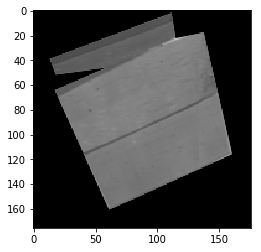

In [465]:
path_cropped = "data1_cropped/extract/1.tiff"
if os.path.isfile(path_img):
    cropped = cv.imread(path_cropped)
else:
    print ("The file " + path_cropped + " does not exist.")

plt.imshow(cropped)

In [447]:
def draw_labels_custom(image, labels_df, thickness, color, fill_poly):
    pts = np.array(labels_df).reshape((-1,1,2))
    if fill_poly:
        image = cv.fillPoly(image, np.int32([pts]), color=rgb(color))
    else:
        image = cv.polylines(image, np.int32([pts]), True, color=rgb(color), thickness=thickness)

    return image

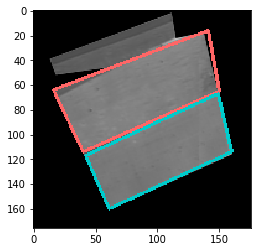

In [466]:
idx = 1
seg_tissue = boxes_tissues[idx:idx+1]
seg_mag = boxes_mag[idx:idx+1]

cropped = draw_labels_custom(cropped, seg_tissue, 2, tissue_color, fill_poly)
cropped = draw_labels_custom(cropped, seg_mag, 2, magnet_color, fill_poly)

plt.imshow(cropped)

In [467]:
cv.imwrite("test_checked.tiff", cropped)

True

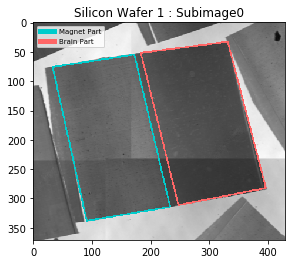

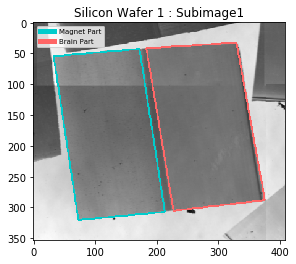

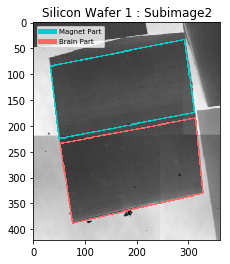

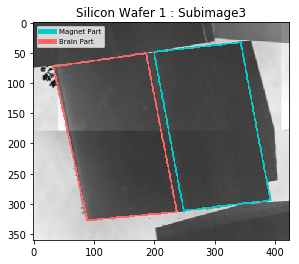

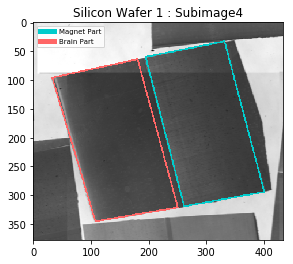

...

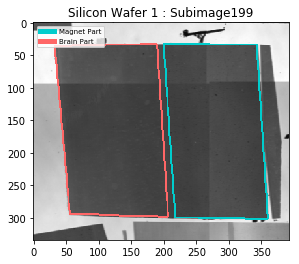

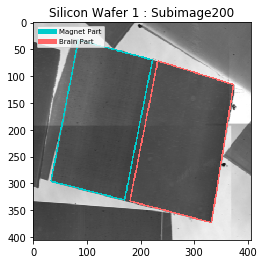

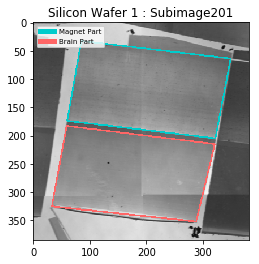

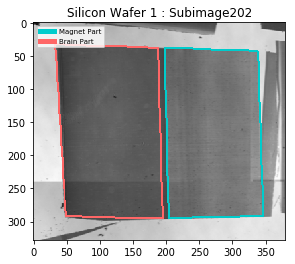

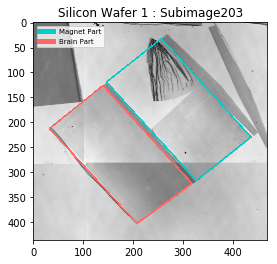

In [448]:

for i in range(boxes_mag.shape[0]):
    path_cropped = "data3_cropped/"+str(i)+".tiff"
    if os.path.isfile(path_img):
        cropped = cv.imread(path_cropped)
    else:
        print ("The file " + path_cropped + " does not exist.")
    
    seg_tissue = boxes_tissues[i:i+1]
    seg_mag = boxes_mag[i:i+1]
    
    cropped = draw_labels_custom(cropped, seg_tissue, 2, tissue_color, fill_poly)
    cropped = draw_labels_custom(cropped, seg_mag, 2, magnet_color, fill_poly)

    plt.imshow(cropped)
    plt.title("Silicon Wafer 1 : Subimage"+str(i))
    legend_elements = [Line2D([0], [0], color=magnet_color, lw=thickness, label='Magnet Part'),
                       Line2D([0], [0], color=tissue_color, lw=thickness, label='Brain Part')]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=7)

    plt.show()   
    cv.waitKey(1)
